<a href="https://colab.research.google.com/github/duhajarrar/Fiat-Currency-Detection-with-YOLOv5/blob/main/FiatCurrencyDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Fiat Currency Detection with YOLOv5**
---

> Duha Jarrar 1171742

> Leena Bany Odeh 1172351

> Raghad Qadah 1170142









In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Unzip dataset**



**Our Dataset size : 900 image** , 
**[The dataset used find it here]( https://drive.google.com/drive/folders/1cTltX2Kj73jYscG7zq7isonizMQfBo5m?usp=sharing )** 

In [ ]:
!unzip -q /content/drive/MyDrive/Dataset/DataSet.v2-Money.yolov5pytorch.zip

# **Rename**

In [ ]:
import os
import numpy as np

data = "/content/valid/images/"
ldseg=np.array(os.listdir(data))
data1 = "/content/valid/labels/"
ldseg1=np.array(os.listdir(data1))
chars="-_()"
ii = 0
for filename in ldseg: 
     src =data+ filename
     for i in chars:
       filename=filename.replace(i,"") 
     dst =data+filename
     os.rename(src, dst)
     ii+=1
print(ii)
ii=0
for filename in ldseg1: 
     src =data1+ filename
     for i in chars:
       filename=filename.replace(i,"") 
     dst =data1+filename
     os.rename(src, dst)
     ii += 1


90


# **Yolov5 Setup**

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/


Cloning into 'yolov5'...
remote: Enumerating objects: 7091, done.
remote: Counting objects: 100% (197/197), done.
remote: Compressing objects: 100% (134/134), done.
remote: Total 7091 (delta 106), reused 117 (delta 63), pack-reused 6894
Receiving objects: 100% (7091/7091), 9.17 MiB | 23.42 MiB/s, done.
Resolving deltas: 100% (4844/4844), done.
/content/yolov5


In [ ]:
!pip install -r requirements.txt

     |████████████████████████████████| 645kB 9.5MB/s 
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!/content/yolov5/weights/download_weights.sh

100% 14.1M/14.1M [00:00<00:00, 48.3MB/s]

100% 41.1M/41.1M [00:00<00:00, 48.1MB/s]

100% 90.2M/90.2M [00:01<00:00, 93.1MB/s]

100% 168M/168M [00:01<00:00, 100MB/s]



In [ ]:
%%writefile detect.py
import argparse
import time
from pathlib import Path
import random
import cv2
import torch
import torch.backends.cudnn as cudnn

from models.experimental import attempt_load
from utils.datasets import LoadStreams, LoadImages
from utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression, apply_classifier, \
    scale_coords, xyxy2xywh, strip_optimizer, set_logging, increment_path, save_one_box
from utils.plots import colors, plot_one_box
from utils.torch_utils import select_device, load_classifier, time_synchronized
label2Sum={'20ILS-old':20,'50ILS-old':50,'100ILS-old':100,'200ILS-old':200,'20ILS':20,'50ILS':50,'100ILS':100,'200ILS':200,'1USD':3.5,'5USD':5*3.5,'20USD':20*3.5,'50USD':50*3.5,'100USD':100*3.5,'1JOD':1*5,'5JOD':5*5,'10JOD':10*5,'20JOD':20*5,'50JOD':50*5,'20ILS-fake':0,'50ILS-fake':0,'100ILS-fake':0,'200ILS-fake':0}
sum1=0
def plot_one_box(x, img, color=None, label=None, line_thickness=None): 
     # Plots one bounding box on image img 
     tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness 
     color = color or [random.randint(0, 255) for _ in range(3)] 
     c1, c2 = (int(x[0]), int(x[1])+20), (int(x[2]), int(x[3])+20) 
     cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA) 
     if label: 
         tf = max(tl - 1, 1)  # font thickness 
         t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0] 
         c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3 
         cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled 
         cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA) 
  

@torch.no_grad()
def detect(opt):
    source, weights, view_img, save_txt, imgsz = opt.source, opt.weights, opt.view_img, opt.save_txt, opt.img_size
    save_img = not opt.nosave and not source.endswith('.txt')  # save inference images
    webcam = source.isnumeric() or source.endswith('.txt') or source.lower().startswith(
        ('rtsp://', 'rtmp://', 'http://', 'https://'))

    # Directories
    save_dir = increment_path(Path(opt.project) / opt.name, exist_ok=opt.exist_ok)  # increment run
    (save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Initialize
    set_logging()
    device = select_device(opt.device)
    half = opt.half and device.type != 'cpu'  # half precision only supported on CUDA

    # Load model
    model = attempt_load(weights, map_location=device)  # load FP32 model
    stride = int(model.stride.max())  # model stride
    imgsz = check_img_size(imgsz, s=stride)  # check img_size
    names = model.module.names if hasattr(model, 'module') else model.names  # get class names
    if half:
        model.half()  # to FP16

    # Second-stage classifier
    classify = False
    if classify:
        modelc = load_classifier(name='resnet101', n=2)  # initialize
        modelc.load_state_dict(torch.load('weights/resnet101.pt', map_location=device)['model']).to(device).eval()

    # Set Dataloader
    vid_path, vid_writer = None, None
    if webcam:
        view_img = check_imshow()
        cudnn.benchmark = True  # set True to speed up constant image size inference
        dataset = LoadStreams(source, img_size=imgsz, stride=stride)
    else:
        dataset = LoadImages(source, img_size=imgsz, stride=stride)

    # Run inference
    if device.type != 'cpu':
        model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))  # run once
    t0 = time.time()
    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device)
        img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
            img = img.unsqueeze(0)

        # Inference
        t1 = time_synchronized()
        pred = model(img, augment=opt.augment)[0]

        # Apply NMS
        pred = non_max_suppression(pred, opt.conf_thres, opt.iou_thres, opt.classes, opt.agnostic_nms,
                                   max_det=opt.max_det)
        t2 = time_synchronized()

        # Apply Classifier
        if classify:
            pred = apply_classifier(pred, modelc, img, im0s)

        # Process detections
        for i, det in enumerate(pred):  # detections per image
            if webcam:  # batch_size >= 1
                p, s, im0, frame = path[i], f'{i}: ', im0s[i].copy(), dataset.count
            else:
                p, s, im0, frame = path, '', im0s.copy(), getattr(dataset, 'frame', 0)

            p = Path(p)  # to Path
            save_path = str(save_dir / p.name)  # img.jpg
            txt_path = str(save_dir / 'labels' / p.stem) + ('' if dataset.mode == 'image' else f'_{frame}')  # img.txt
            s += '%gx%g ' % img.shape[2:]  # print string
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh
            imc = im0.copy() if opt.save_crop else im0  # for opt.save_crop
            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

                # Print results
                for c in det[:, -1].unique():
                    n = (det[:, -1] == c).sum()  # detections per class
                    s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string
            
                duha=0
                sum1=0
                # Write results
                for *xyxy, conf, cls in reversed(det):
                    if save_txt:  # Write to file
                        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                        line = (cls, *xywh, conf) if opt.save_conf else (cls, *xywh)  # label format
                        with open(txt_path + '.txt', 'a') as f:
                            f.write(('%g ' * len(line)).rstrip() % line + '\n')

                    if save_img or opt.save_crop or view_img:  # Add bbox to image
                        c = int(cls)  # integer class
                        label = None if opt.hide_labels else (names[c] if opt.hide_conf else f'{names[c]} {conf:.2f}')
                        #plot_one_box(xyxy, im0, label=label, color=colors(c, True), line_thickness=opt.line_thickness)
                        plot_one_box(xyxy, im0, label=label, color=colors(c, True), line_thickness=3)
                       # print("*******",label.split()[0],"LLLLLLLL")
                        if label.split()[0] in label2Sum:
                          sum1+=label2Sum[label.split()[0]]
                        #print(type(xyxy),"#############################",xyxy)
                        if opt.save_crop:
                            save_one_box(xyxy, imc, file=save_dir / 'crops' / names[c] / f'{p.stem}.jpg', BGR=True)
                            
                   
#random.randint(0,200),random.randint(0,230),random.randint(0,200)
                # Print time (inference + NMS)
                cv2.putText(im0, text=str("Count = "+str(sum1)+"ILS"), org=(70,100),fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255,0,0), thickness=2, lineType=cv2.LINE_AA)
                print("********************",sum1,"******************")
                sum1=0
            print(f'{s}Done. ({t2 - t1:.3f}s)')

            # Stream results
            if view_img:
                cv2.imshow(str(p), im0)
                cv2.waitKey(1)  # 1 millisecond

            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'image':
                    cv2.imwrite(save_path, im0)
                else:  # 'video' or 'stream'
                    if vid_path != save_path:  # new video
                        vid_path = save_path
                        if isinstance(vid_writer, cv2.VideoWriter):
                            vid_writer.release()  # release previous video writer
                        if vid_cap:  # video
                            fps = vid_cap.get(cv2.CAP_PROP_FPS)
                            w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                            h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                        else:  # stream
                            fps, w, h = 30, im0.shape[1], im0.shape[0]
                            save_path += '.mp4'
                        vid_writer = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))
                    vid_writer.write(im0)

    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        print(f"Results saved to {save_dir}{s}")

    print(f'Done. ({time.time() - t0:.3f}s)')


if __name__ == '__main__':
    parser = argparse.ArgumentParser()
    parser.add_argument('--weights', nargs='+', type=str, default='yolov5s.pt', help='model.pt path(s)')
    parser.add_argument('--source', type=str, default='data/images', help='source')  # file/folder, 0 for webcam
    parser.add_argument('--img-size', type=int, default=640, help='inference size (pixels)')
    parser.add_argument('--conf-thres', type=float, default=0.25, help='object confidence threshold')
    parser.add_argument('--iou-thres', type=float, default=0.45, help='IOU threshold for NMS')
    parser.add_argument('--max-det', type=int, default=1000, help='maximum number of detections per image')
    parser.add_argument('--device', default='', help='cuda device, i.e. 0 or 0,1,2,3 or cpu')
    parser.add_argument('--view-img', action='store_true', help='display results')
    parser.add_argument('--save-txt', action='store_true', help='save results to *.txt')
    parser.add_argument('--save-conf', action='store_true', help='save confidences in --save-txt labels')
    parser.add_argument('--save-crop', action='store_true', help='save cropped prediction boxes')
    parser.add_argument('--nosave', action='store_true', help='do not save images/videos')
    parser.add_argument('--classes', nargs='+', type=int, help='filter by class: --class 0, or --class 0 2 3')
    parser.add_argument('--agnostic-nms', action='store_true', help='class-agnostic NMS')
    parser.add_argument('--augment', action='store_true', help='augmented inference')
    parser.add_argument('--update', action='store_true', help='update all models')
    parser.add_argument('--project', default='runs/detect', help='save results to project/name')
    parser.add_argument('--name', default='exp', help='save results to project/name')
    parser.add_argument('--exist-ok', action='store_true', help='existing project/name ok, do not increment')
    parser.add_argument('--line-thickness', default=3, type=int, help='bounding box thickness (pixels)')
    parser.add_argument('--hide-labels', default=False, action='store_true', help='hide labels')
    parser.add_argument('--hide-conf', default=False, action='store_true', help='hide confidences')
    parser.add_argument('--half', type=bool, default=False, help='use FP16 half-precision inference')
    opt = parser.parse_args()
    print(opt)
    check_requirements(exclude=('tensorboard', 'pycocotools', 'thop'))

    if opt.update:  # update all models (to fix SourceChangeWarning)
        for opt.weights in ['yolov5s.pt', 'yolov5m.pt', 'yolov5l.pt', 'yolov5x.pt']:
            detect(opt=opt)
            strip_optimizer(opt.weights)
    else:
        detect(opt=opt)


Overwriting detect.py


# **Train Data**

In [ ]:
!python train.py --img 416 --batch 8 --epochs 300 --data /content/data.yaml --weights yolov5s.pt --nosave --cache

github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-180-ge8c5237 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=8, bbox_interval=-1, bucket='', cache_images=True, cfg='', data='/content/data.yaml', device='', entity=None, epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='exp', noautoanchor=False, nosave=True, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/exp', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=8, upload_dataset=False, weights='yolov5s.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-06-11 10:24:03.881154: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynam

# **Display some trained Images**

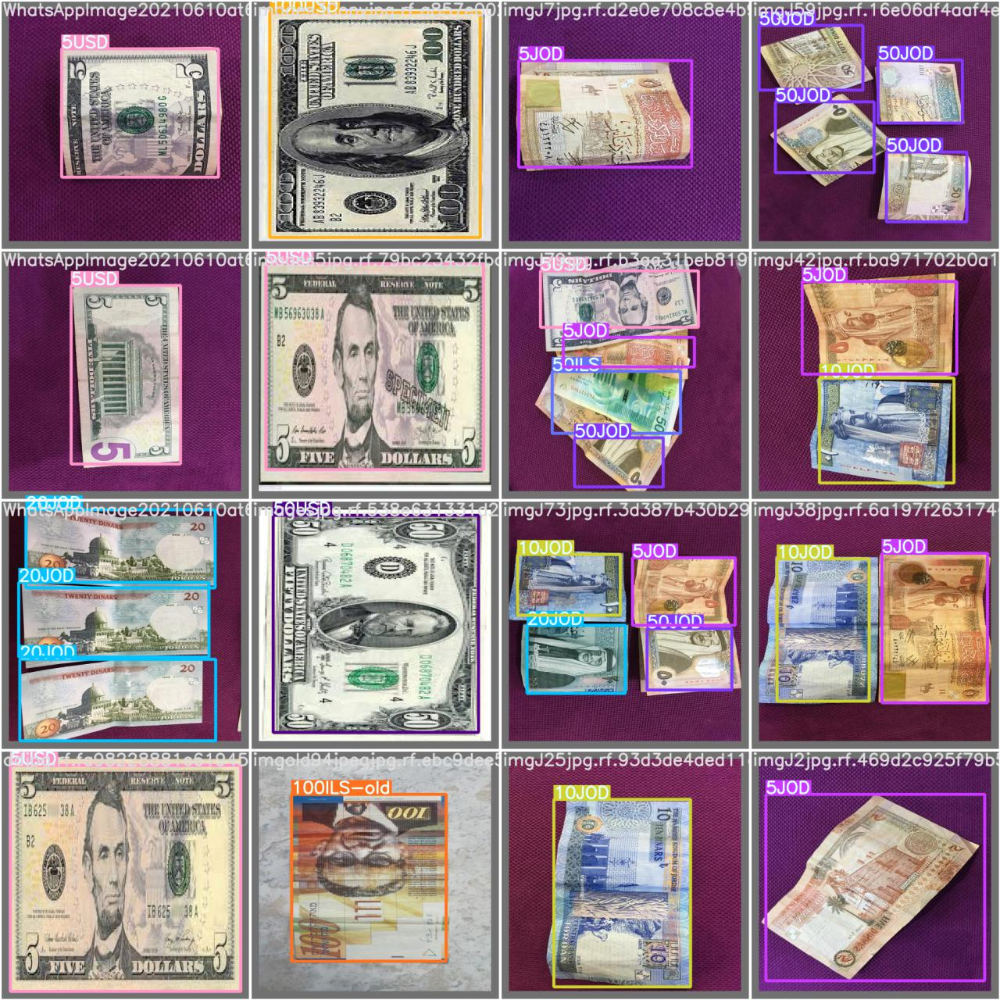

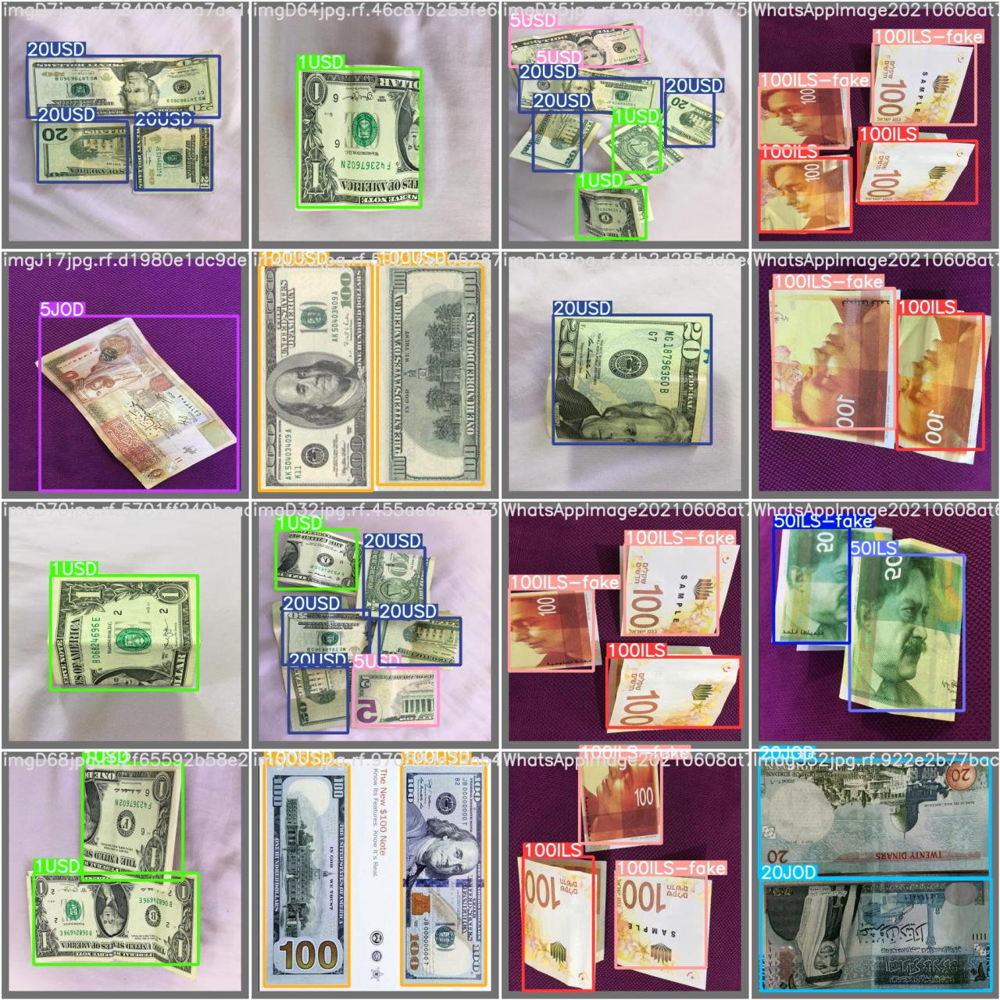

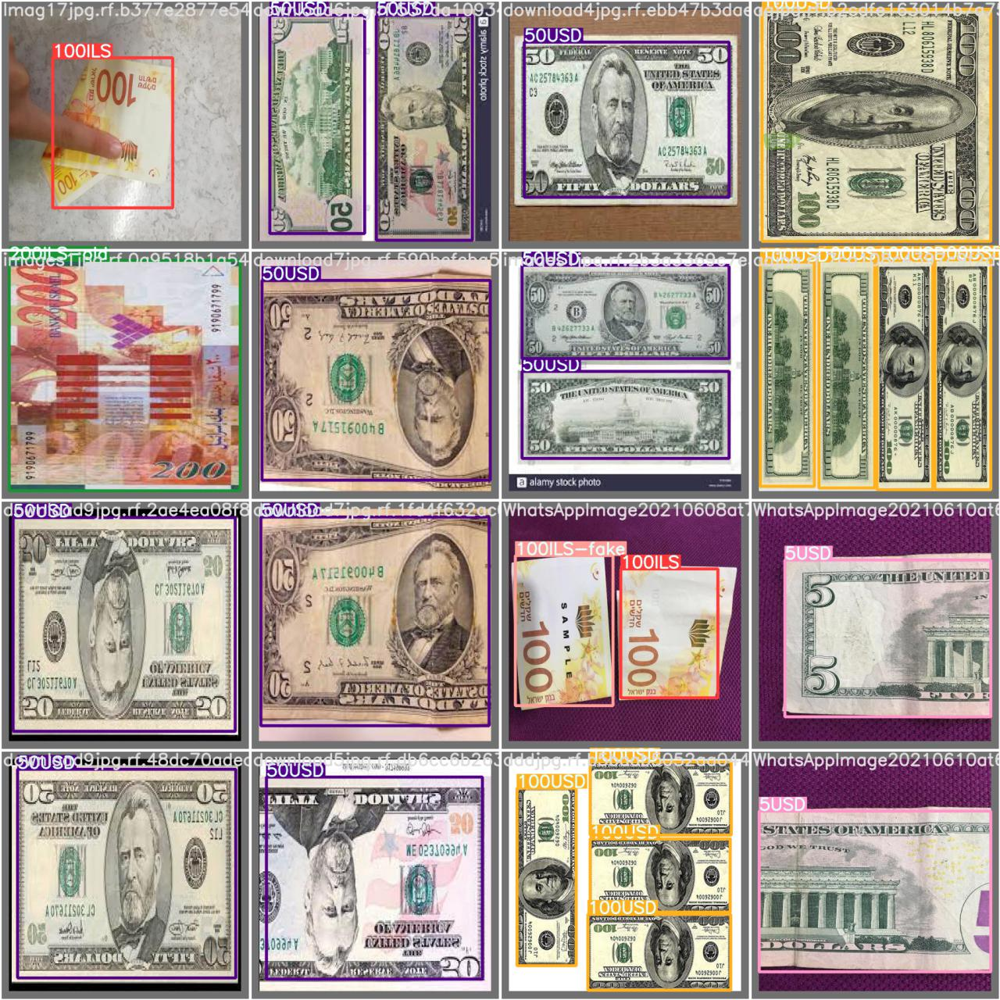

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/train/exp/*_labels.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# **Test Data**

In [ ]:
!python test.py --weights /content/yolov5/runs/train/exp/weights/last.pt --data /content/data.yaml --img 416

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='/content/data.yaml', device='', exist_ok=False, half=False, imgsz=416, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/yolov5/runs/train/exp/weights/last.pt'])
YOLOv5 🚀 v5.0-180-ge8c5237 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7102456 parameters, 0 gradients, 16.5 GFLOPs
val: Scanning '../valid/labels.cache' images and labels... 90 found, 0 missing, 0 empty, 0 corrupted: 100% 90/90 [00:00<00:00, 1017486.15it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:01<00:00,  1.78it/s]
                 all         90        181      0.982      0.966      0.987       0.82
              100ILS         90         17          1      0.895      0.945      0.763
         100ILS-fake         90       

# Display some tested Images

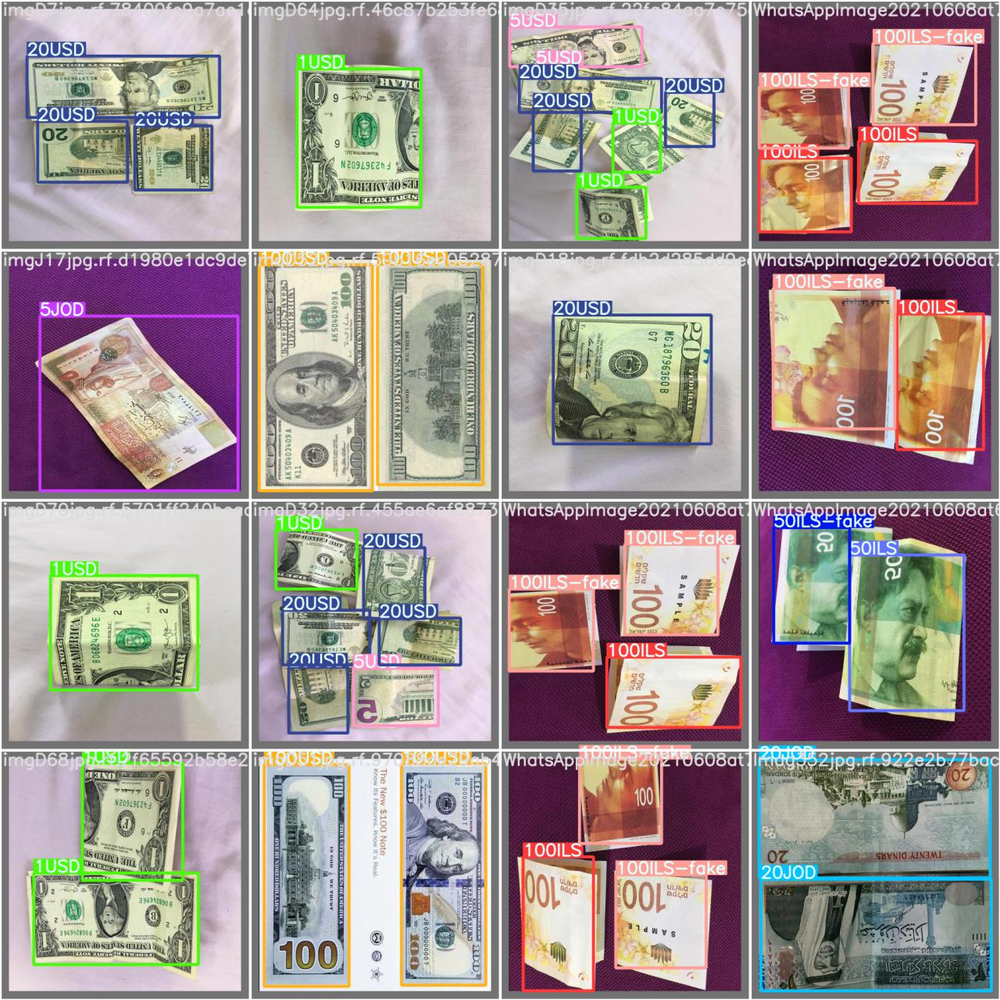

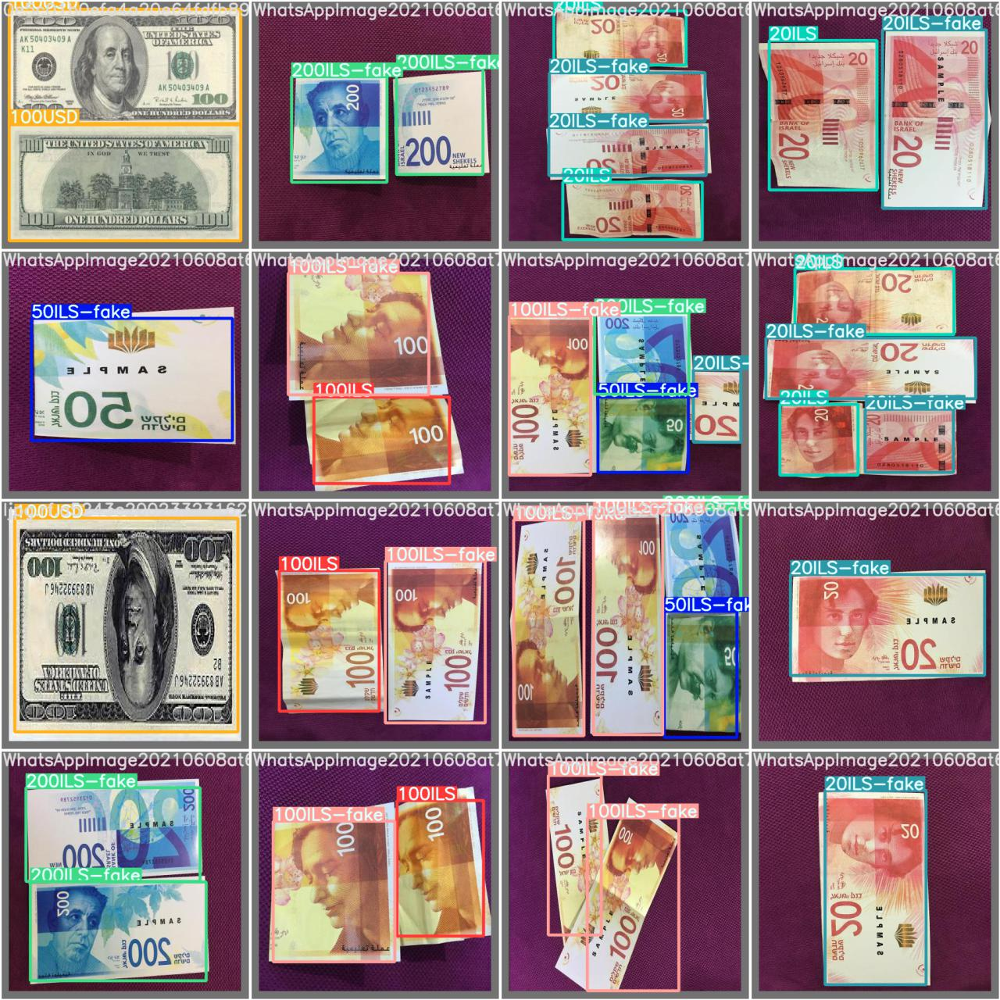

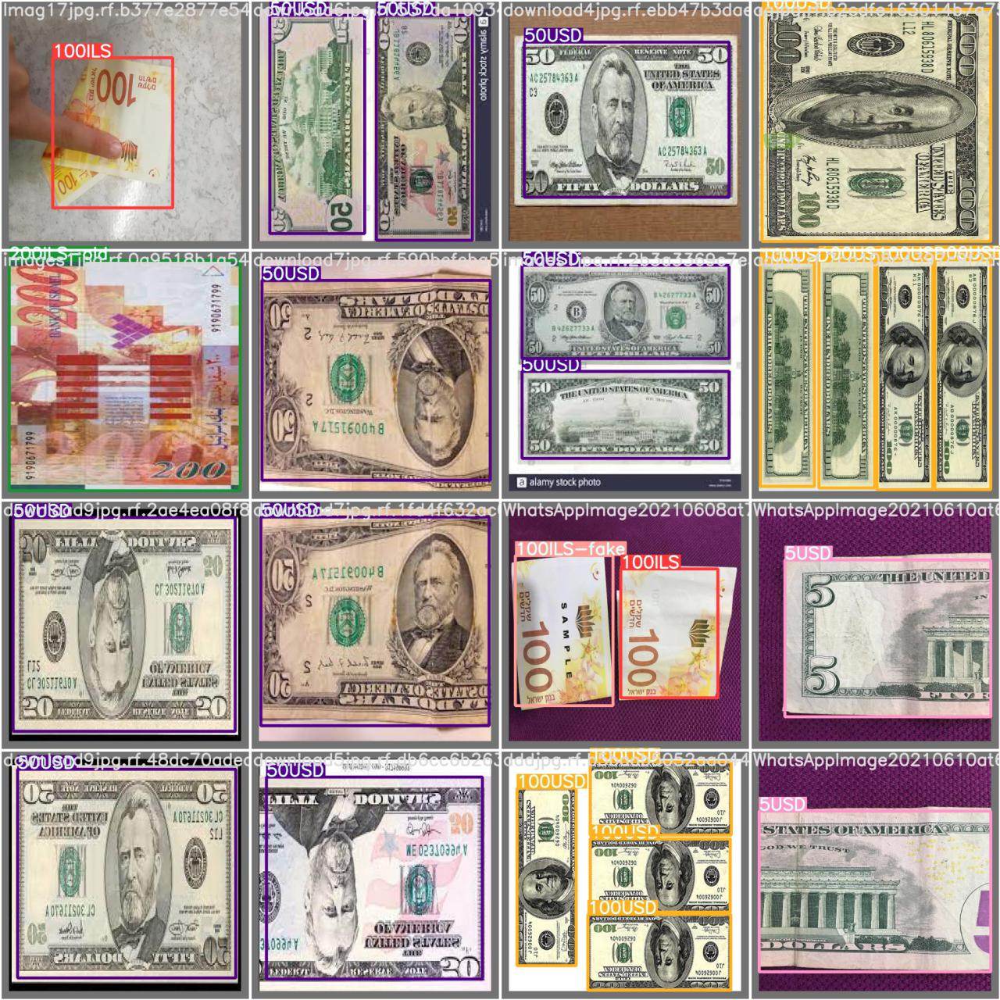

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/test/exp/*_labels.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# **Detect Data**

In [ ]:
!python detect.py --source /content/test/images --weights /content/yolov5/runs/train/exp/weights/last.pt --img 416 --save-txt --save-conf

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=True, save_crop=False, save_txt=True, source='/content/test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/exp/weights/last.pt'])
YOLOv5 🚀 v5.0-180-ge8c5237 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7102456 parameters, 0 gradients, 16.5 GFLOPs
image 1/89 /content/test/images/Imag14_jpg.rf.dce85987ebfa11f6df035705e6106a00.jpg: ******************** 40 ******************
416x416 2 20ILSs, Done. (0.010s)
image 2/89 /content/test/images/Imag208_jpg.rf.f2f4ece28e408ac1349cf423f1b5e276.jpg: ******************** 40 ******************
416x416 2 20ILSs, Done. (0.010s)
image 3/89 /content/test/images/Imag212_jpg.rf.d6fdfcd88c31d08a9baa086682967f88.jp

# **Display All Test Images**




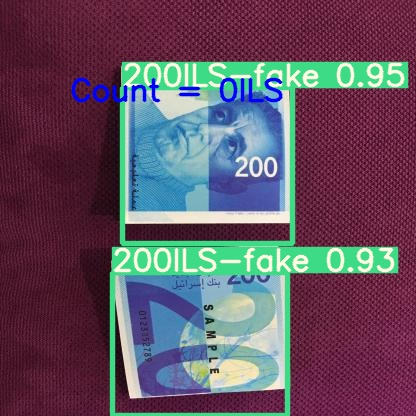

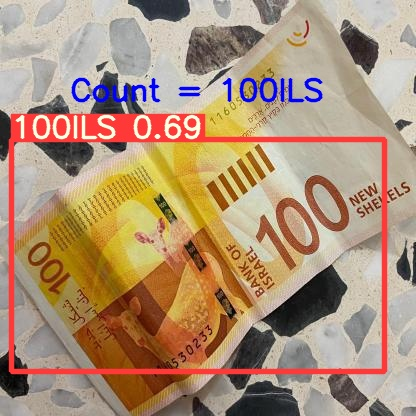

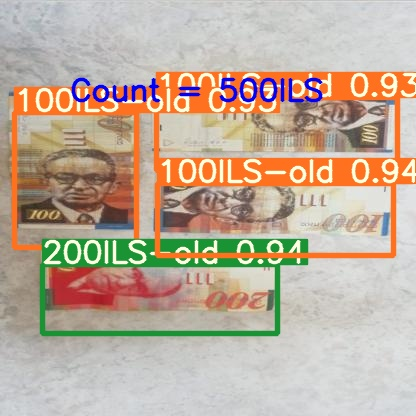

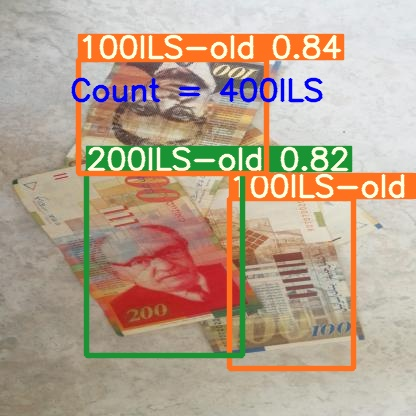

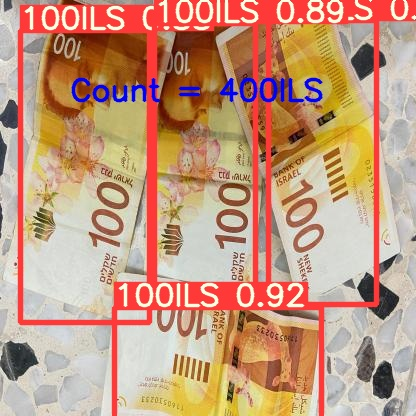

...

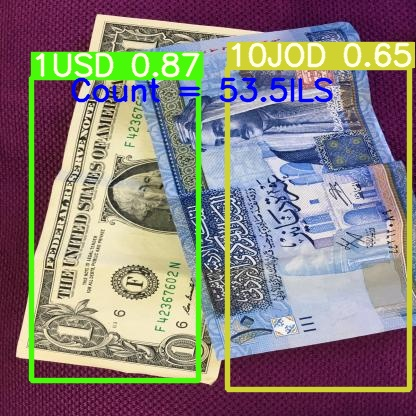

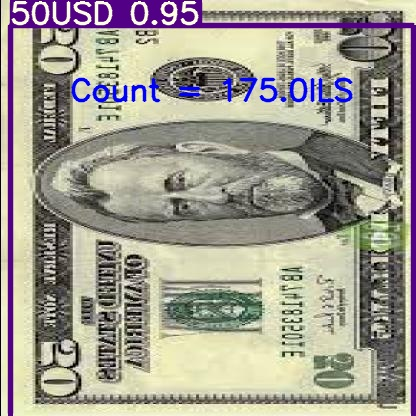

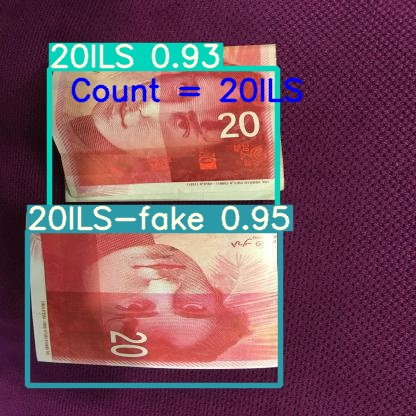

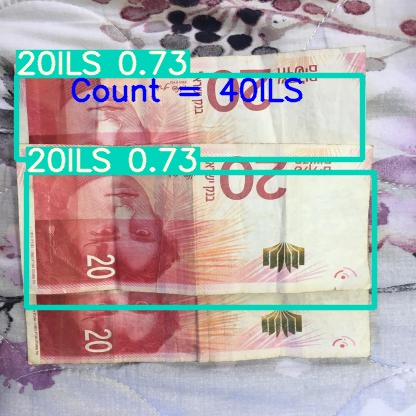

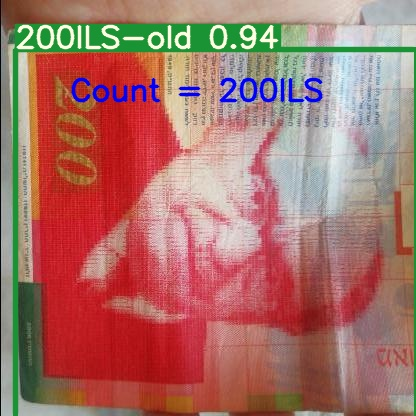

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# **Evaluate  Performance**

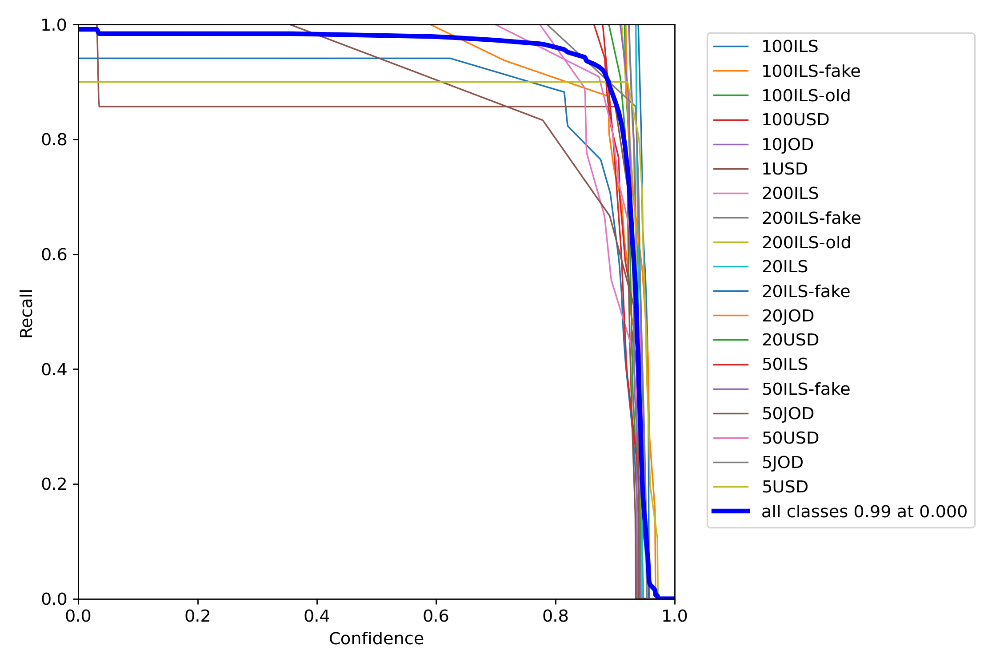

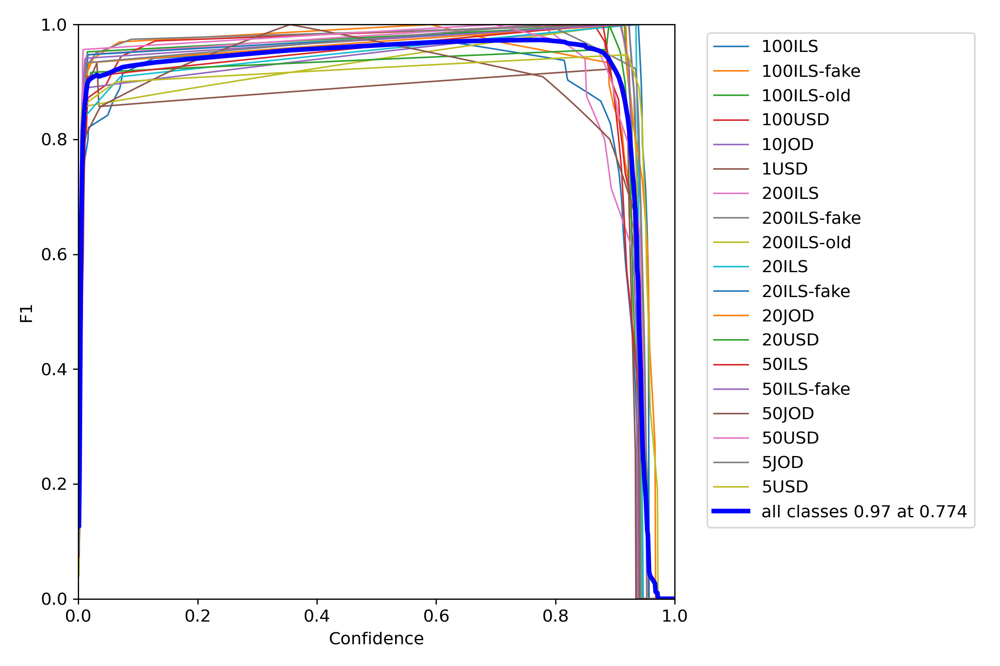

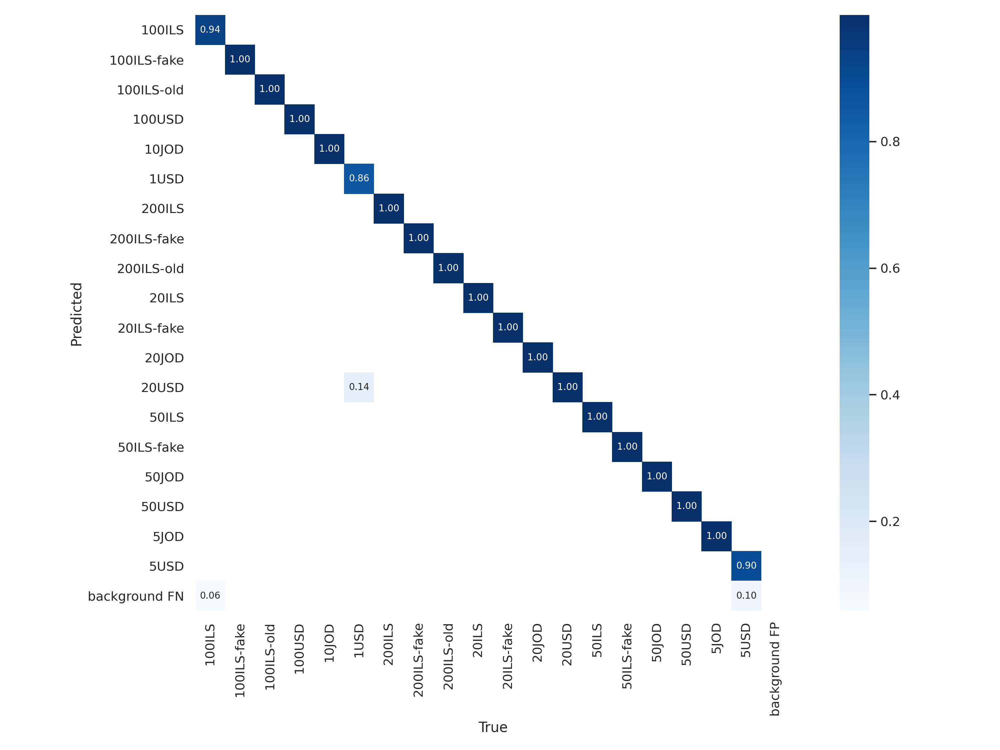

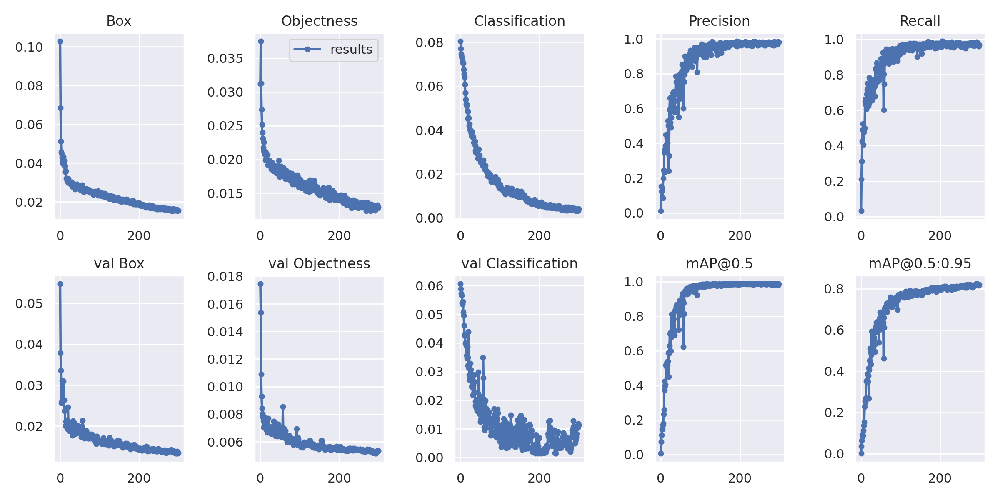

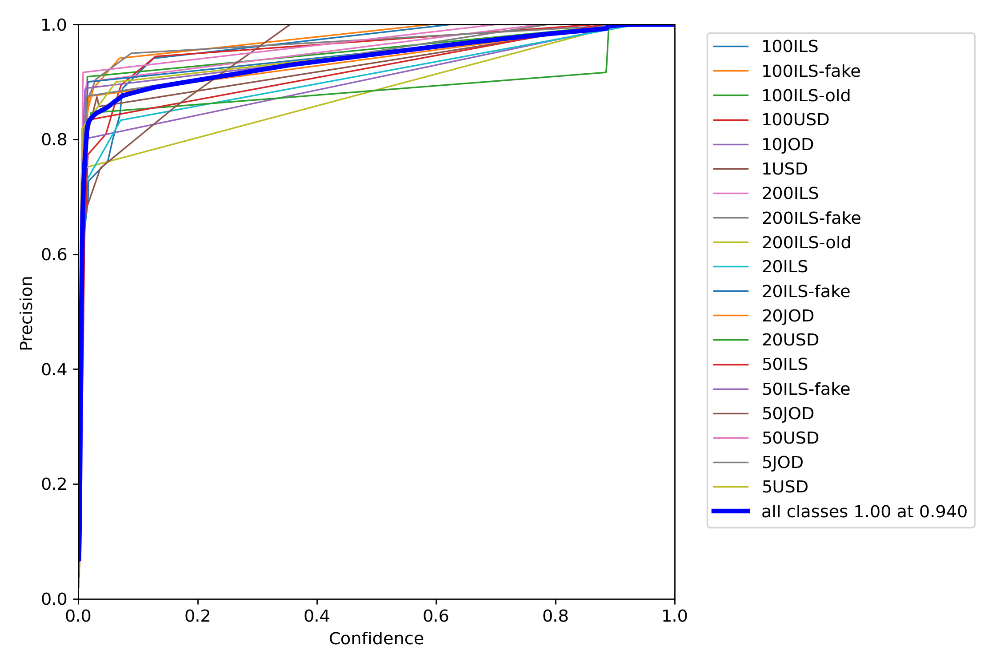

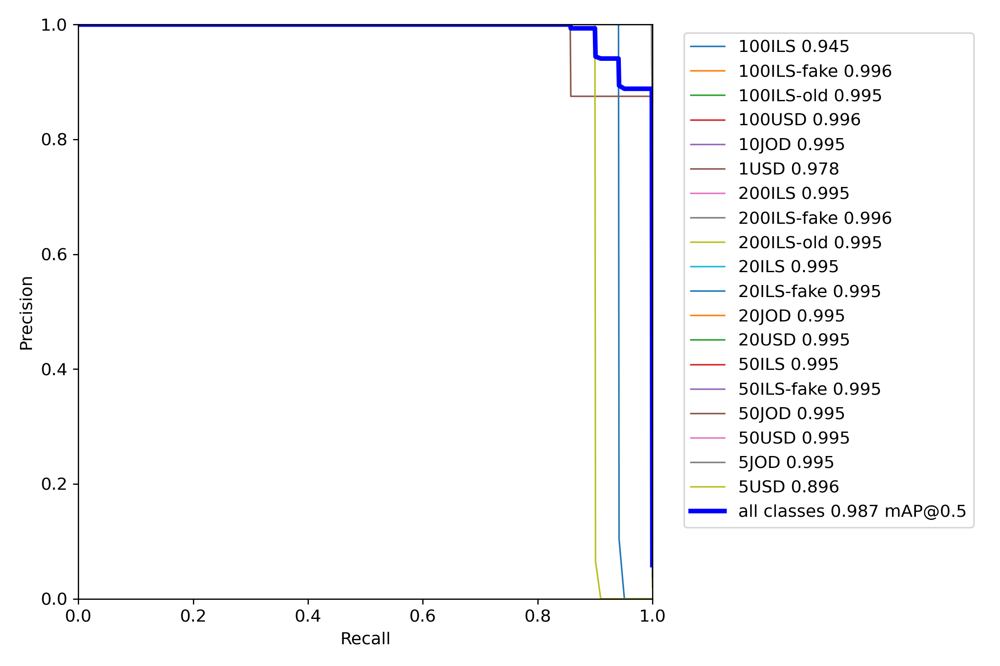

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/train/exp/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")